<a href="https://colab.research.google.com/github/Mtiwari27/ML_Mini_Project/blob/main/Model%20Evaluation/ML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Telecom Churn**

The data is sourced from Kaggle comprising of The Orange Telecom groups datalog of it's clients

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [114]:
import sklearn
print(sklearn.__version__)

1.2.2


In [ ]:
df = pd.read_csv('/content/churn-bigml-20.csv')

In [ ]:
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,LA,117,408,No,No,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,False
1,IN,65,415,No,No,0,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,12.7,6,3.43,4,True
2,NY,161,415,No,No,0,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,5.4,9,1.46,4,True
3,SC,111,415,No,No,0,110.4,103,18.77,137.3,102,11.67,189.6,105,8.53,7.7,6,2.08,2,False
4,HI,49,510,No,No,0,119.3,117,20.28,215.1,109,18.28,178.7,90,8.04,11.1,1,3.00,1,False


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 667 entries, 0 to 666
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   667 non-null    object 
 1   Account length          667 non-null    int64  
 2   Area code               667 non-null    int64  
 3   International plan      667 non-null    object 
 4   Voice mail plan         667 non-null    object 
 5   Number vmail messages   667 non-null    int64  
 6   Total day minutes       667 non-null    float64
 7   Total day calls         667 non-null    int64  
 8   Total day charge        667 non-null    float64
 9   Total eve minutes       667 non-null    float64
 10  Total eve calls         667 non-null    int64  
 11  Total eve charge        667 non-null    float64
 12  Total night minutes     667 non-null    float64
 13  Total night calls       667 non-null    int64  
 14  Total night charge      667 non-null    fl

In [ ]:
df.isna().sum()

State                     0
Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

In [ ]:
from scipy import stats
from sklearn.preprocessing import LabelEncoder

In [ ]:
label_encoder = LabelEncoder()
df['International plan'] = label_encoder.fit_transform(df['International plan'])
df['Voice mail plan'] = label_encoder.fit_transform(df['Voice mail plan'])

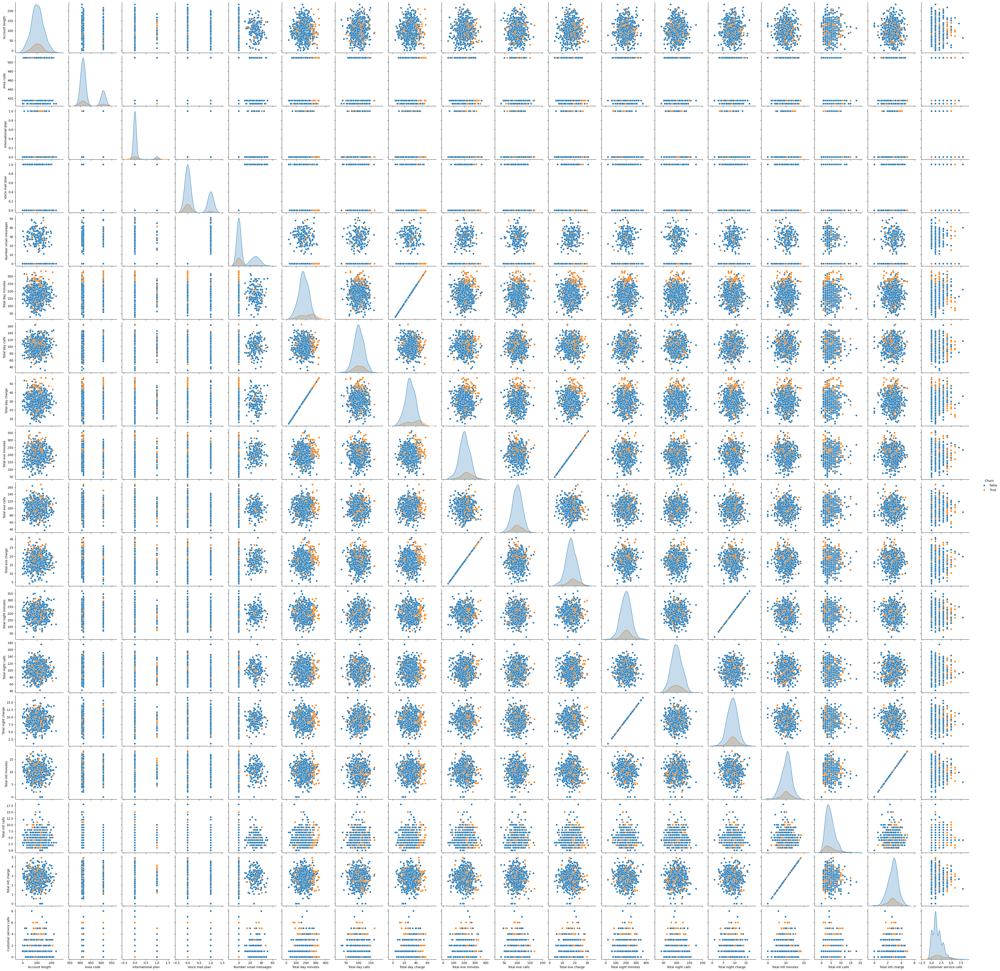

In [ ]:
sns.pairplot(df, hue='Churn')
plt.show()

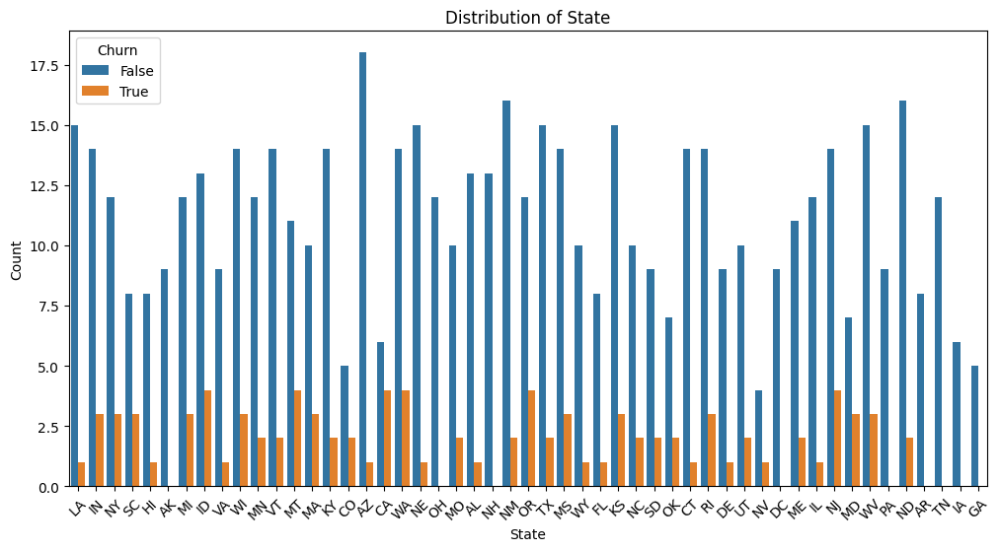

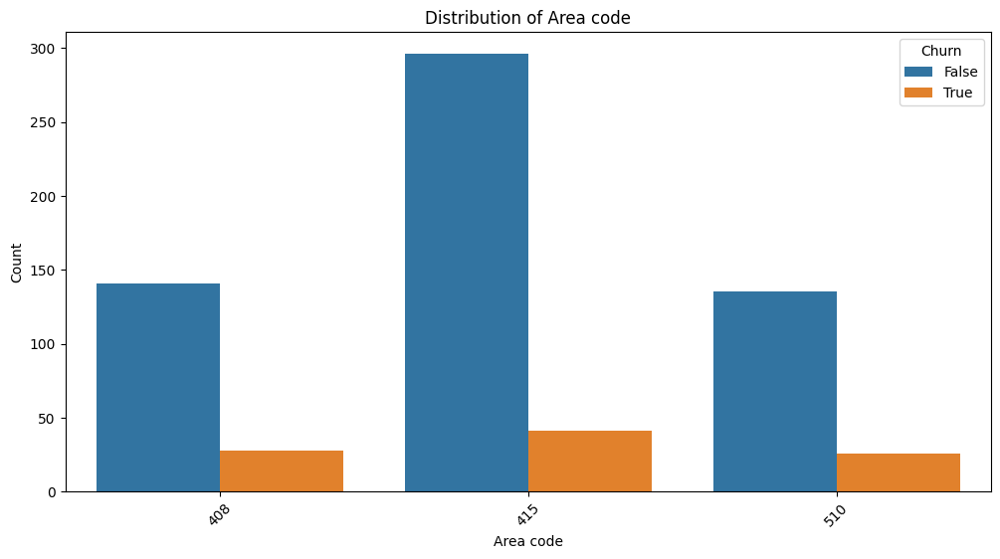

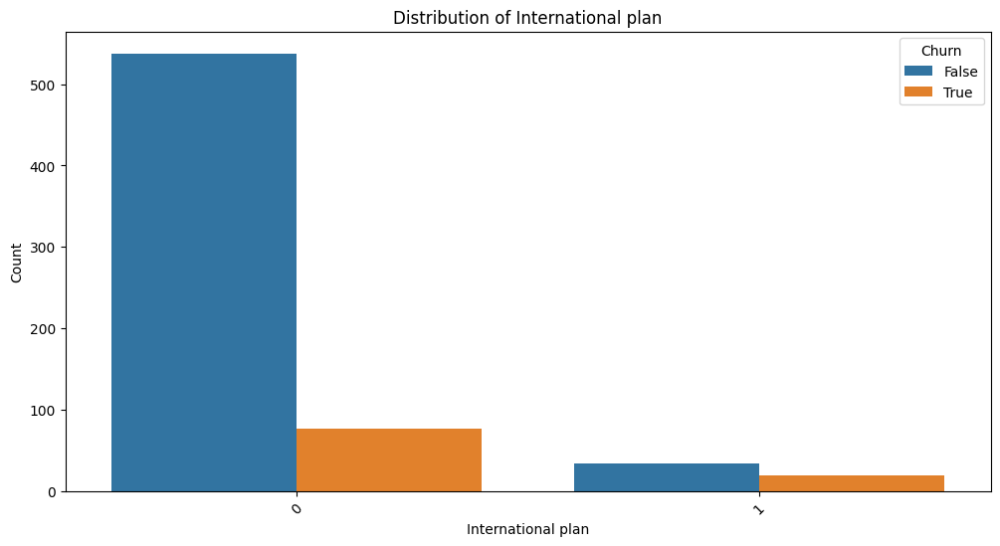

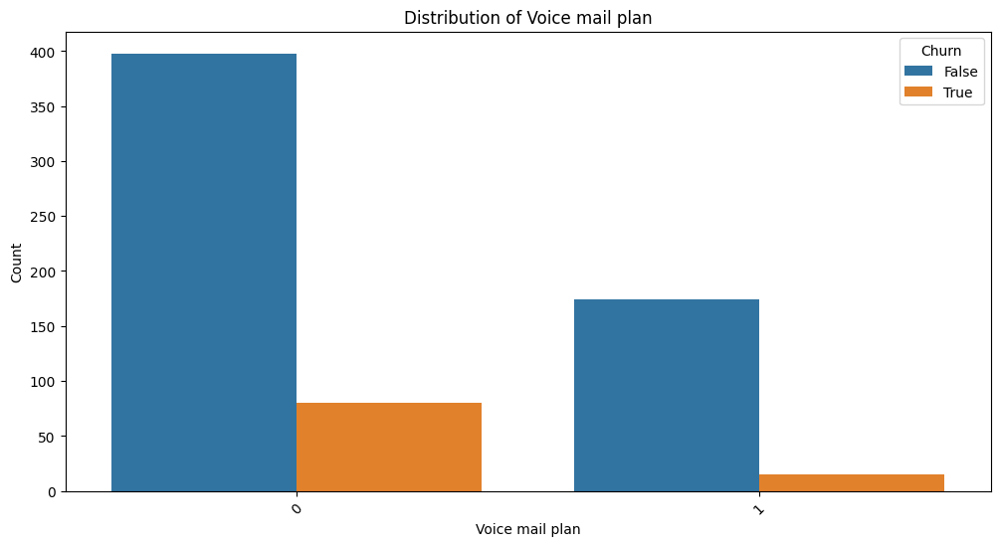

In [ ]:
categorical_features = ['State', 'Area code', 'International plan', 'Voice mail plan']

for feature in categorical_features:
    plt.figure(figsize=(12, 6))
    sns.countplot(x=feature, data=df, hue='Churn')
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

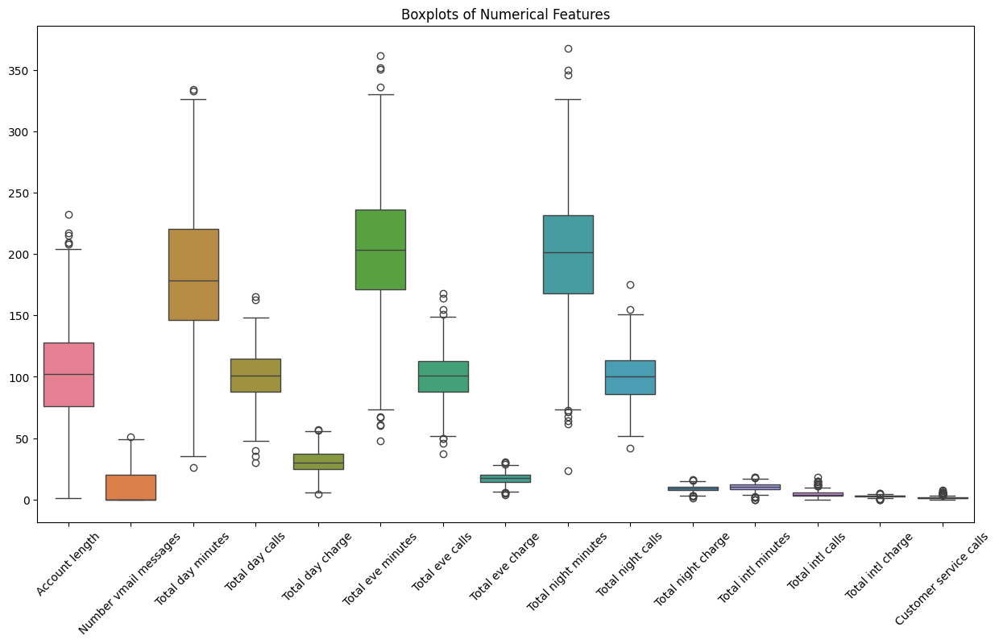

In [ ]:
plt.figure(figsize=(15, 8))
sns.boxplot(data=df.drop(['State', 'Area code', 'International plan', 'Voice mail plan', 'Churn'], axis=1))
plt.title('Boxplots of Numerical Features')
plt.xticks(rotation=45)
plt.show()

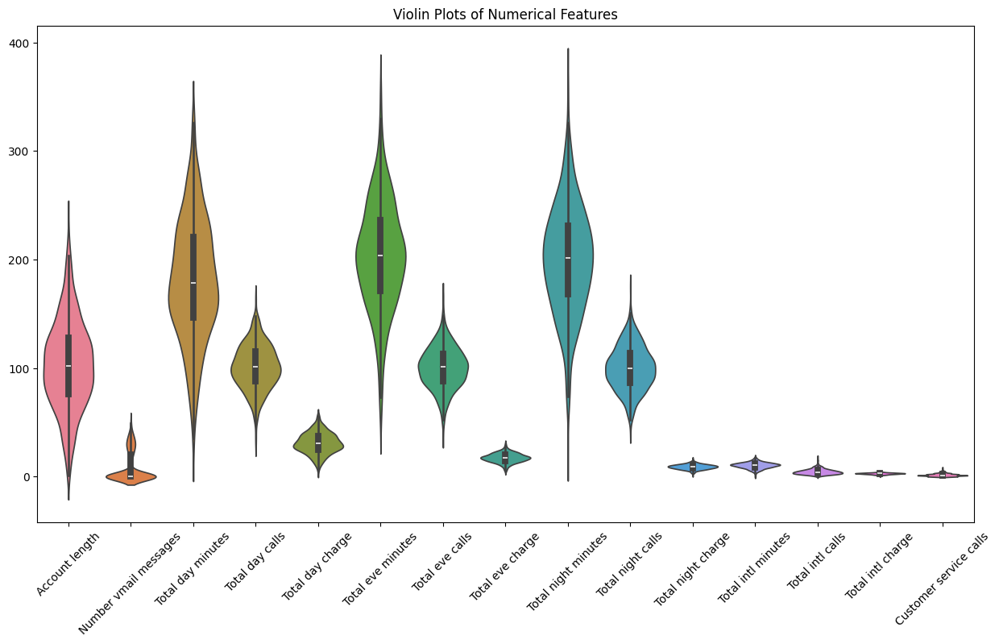

In [ ]:
plt.figure(figsize=(15, 8))
sns.violinplot(data=df.drop(['State', 'Area code', 'International plan', 'Voice mail plan', 'Churn'], axis=1))
plt.title('Violin Plots of Numerical Features')
plt.xticks(rotation=45)
plt.show()

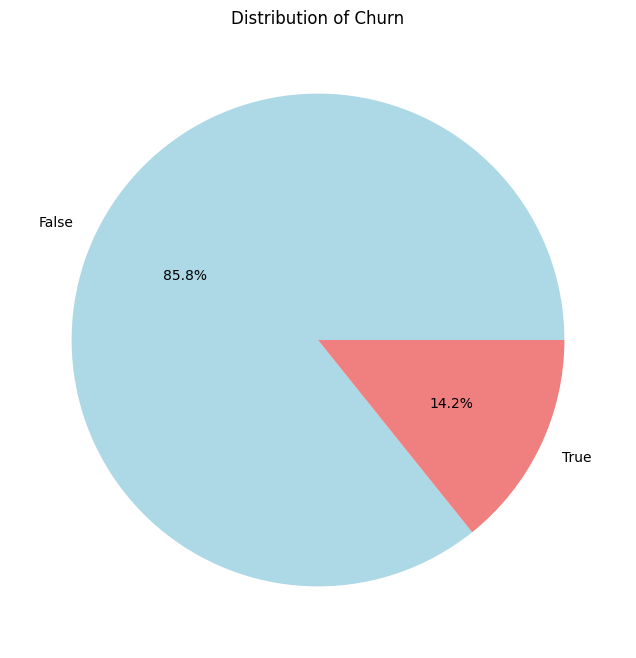

In [ ]:
plt.figure(figsize=(8, 8))
df['Churn'].value_counts().plot(kind='pie', autopct='%1.1f%%', colors=['lightblue', 'lightcoral'])
plt.title('Distribution of Churn')
plt.ylabel('')
plt.show()

For Balancing the Dataset

In [68]:
X = df.drop(columns=['Voice mail plan', 'Number vmail messages', 'Total day minutes',
                     'Total day charge', 'Total eve minutes', 'Total night minutes', 'Churn'])
y = df['Churn']

In [69]:
df['State'] = label_encoder.fit_transform(df['State'])
df['Churn'] = label_encoder.fit_transform(df['Churn'])

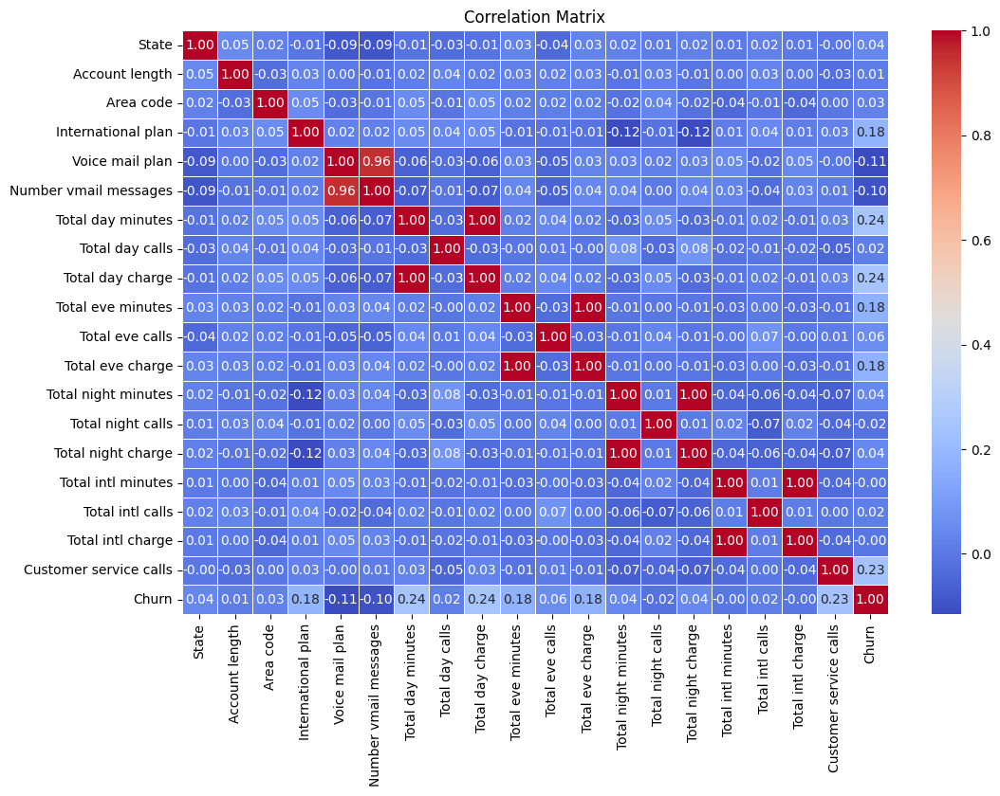

In [70]:
numeric_df = df.select_dtypes(include='number')
correlation_matrix = numeric_df.corr()


plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

In [71]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Assuming X and y are your features and target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Apply SMOTE to balance the training data
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Train a classifier on the balanced data
clf = LogisticRegression()
clf.fit(X_train_resampled, y_train_resampled)

# Evaluate the classifier on the test data
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.95      0.62      0.75       119
           1       0.20      0.73      0.31        15

    accuracy                           0.63       134
   macro avg       0.57      0.68      0.53       134
weighted avg       0.86      0.63      0.70       134



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [72]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# **Logistic Regression**

Used for Binary Classification

uses sigmoid function

In [73]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [74]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 134 entries, 660 to 18
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   134 non-null    int64  
 1   Account length          134 non-null    int64  
 2   Area code               134 non-null    int64  
 3   International plan      134 non-null    int64  
 4   Total day calls         134 non-null    int64  
 5   Total eve calls         134 non-null    int64  
 6   Total eve charge        134 non-null    float64
 7   Total night calls       134 non-null    int64  
 8   Total night charge      134 non-null    float64
 9   Total intl minutes      134 non-null    float64
 10  Total intl calls        134 non-null    int64  
 11  Total intl charge       134 non-null    float64
 12  Customer service calls  134 non-null    int64  
dtypes: float64(4), int64(9)
memory usage: 14.7 KB


In [75]:
lr = LogisticRegression()

In [76]:
lr.fit(X_train_scaled, y_train)

LogisticRegression()

In [77]:
y_pred = lr.predict(X_test_scaled)

In [78]:
from sklearn.metrics import accuracy_score, classification_report, f1_score, confusion_matrix

In [79]:
lr_accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", lr_accuracy)

Accuracy: 0.8805970149253731


In [80]:
lr_f1 = f1_score(y_test, y_pred)
print("F1 Score:", lr_f1)

F1 Score: 0.0


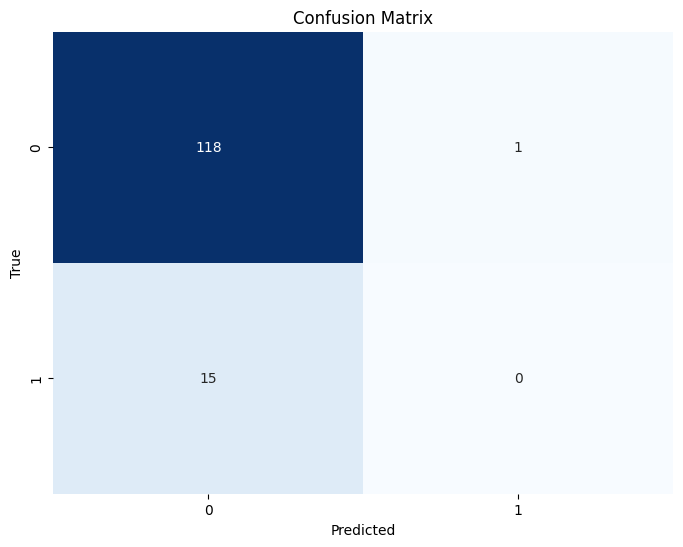

In [81]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# **SVM**
Scaler Vector Machine

In [82]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

In [83]:
X = df.drop(columns=["Churn"])
y = df["Churn"]

In [84]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [85]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 134 entries, 660 to 18
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   134 non-null    int64  
 1   Account length          134 non-null    int64  
 2   Area code               134 non-null    int64  
 3   International plan      134 non-null    int64  
 4   Voice mail plan         134 non-null    int64  
 5   Number vmail messages   134 non-null    int64  
 6   Total day minutes       134 non-null    float64
 7   Total day calls         134 non-null    int64  
 8   Total day charge        134 non-null    float64
 9   Total eve minutes       134 non-null    float64
 10  Total eve calls         134 non-null    int64  
 11  Total eve charge        134 non-null    float64
 12  Total night minutes     134 non-null    float64
 13  Total night calls       134 non-null    int64  
 14  Total night charge      134 non-null    float6

In [86]:
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid']
}


In [87]:
grid_search = GridSearchCV(SVC(), param_grid, cv=5, scoring='f1')
grid_search.fit(X_train_scaled, y_train)

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.1, 1, 10],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
             scoring='f1')

In [88]:
y_pred = grid_search.predict(X_test_scaled)

In [89]:
print("Best Parameters:", grid_search.best_params_)

Best Parameters: {'C': 10, 'kernel': 'rbf'}


In [90]:
svm_accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", svm_accuracy)

Accuracy: 0.9328358208955224


In [91]:
svm_f1 = f1_score(y_test, y_pred)
print("F1 Score:", svm_f1)

F1 Score: 0.6666666666666665


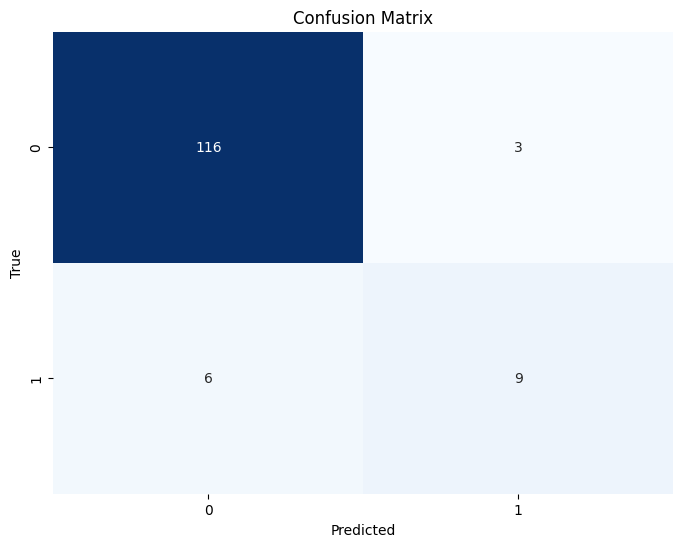

In [92]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# **Random Forest Classifier**

In [93]:
from sklearn.ensemble import RandomForestClassifier

In [94]:
X = df.drop(columns=["Churn"])
y = df["Churn"]

In [95]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [96]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 134 entries, 660 to 18
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   134 non-null    int64  
 1   Account length          134 non-null    int64  
 2   Area code               134 non-null    int64  
 3   International plan      134 non-null    int64  
 4   Voice mail plan         134 non-null    int64  
 5   Number vmail messages   134 non-null    int64  
 6   Total day minutes       134 non-null    float64
 7   Total day calls         134 non-null    int64  
 8   Total day charge        134 non-null    float64
 9   Total eve minutes       134 non-null    float64
 10  Total eve calls         134 non-null    int64  
 11  Total eve charge        134 non-null    float64
 12  Total night minutes     134 non-null    float64
 13  Total night calls       134 non-null    int64  
 14  Total night charge      134 non-null    float6

In [97]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [98]:
y_pred_rf = rf_model.predict(X_test)

In [99]:
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print("Random Forest Accuracy:", accuracy_rf)

Random Forest Accuracy: 0.9626865671641791


In [100]:
f1_rf = f1_score(y_test, y_pred_rf)
print("Random Forest F1 Score:", f1_rf)

Random Forest F1 Score: 0.8148148148148148


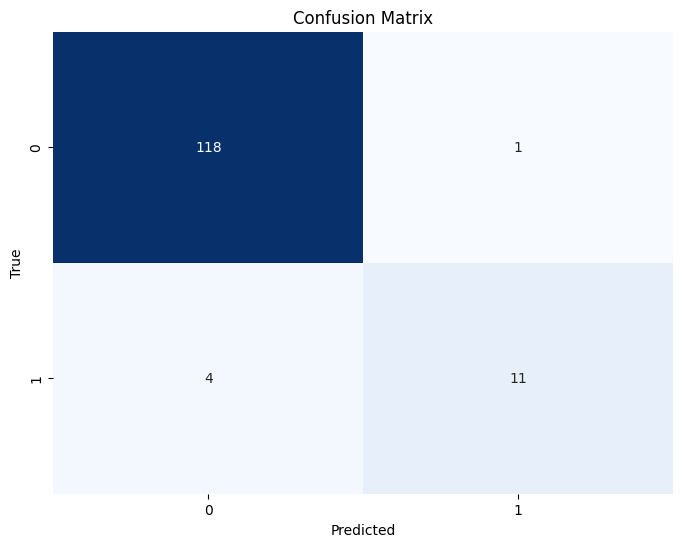

In [101]:
cm = confusion_matrix(y_test, y_pred_rf)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# **XGBoost**

In [102]:
import xgboost as xgb

In [103]:
xgb_model = xgb.XGBClassifier(learning_rate=0.1, n_estimators=100, max_depth=3)  # Adjust parameters as needed
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [104]:
y_pred_xgb = xgb_model.predict(X_test)

In [105]:
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
print("XGBoost Accuracy:", accuracy_xgb)


XGBoost Accuracy: 0.9626865671641791


In [106]:
f1_xgb = f1_score(y_test, y_pred_xgb)
print("XGBoost F1 Score:", f1_xgb)

XGBoost F1 Score: 0.8275862068965518


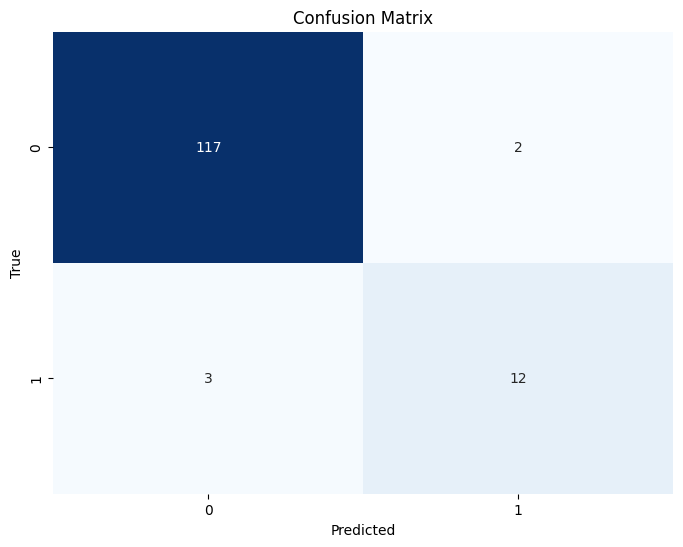

In [107]:
cm = confusion_matrix(y_test, y_pred_xgb)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

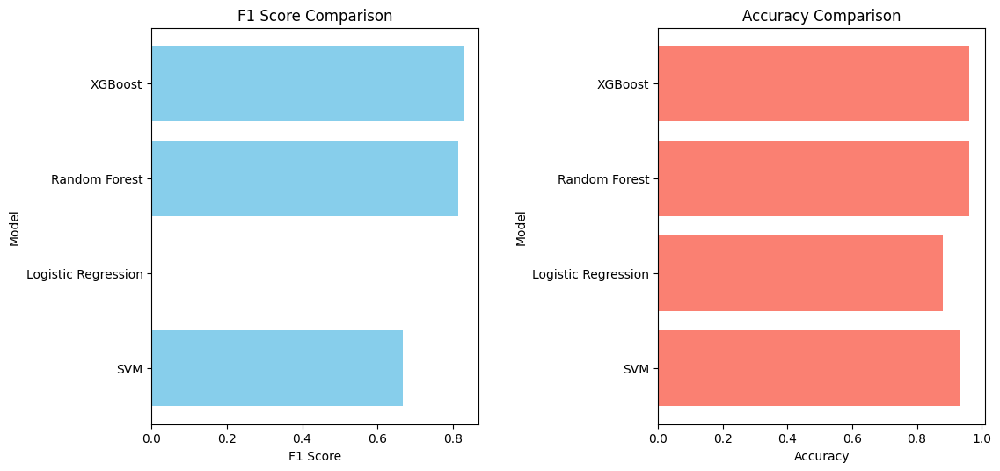

In [108]:
import matplotlib.pyplot as plt

# Evaluation Metrics
models = ['SVM', 'Logistic Regression', 'Random Forest', 'XGBoost']
f1_scores = [svm_f1, lr_f1, f1_rf, f1_xgb]
accuracies = [svm_accuracy, lr_accuracy, accuracy_rf, accuracy_xgb]

# Plotting
plt.figure(figsize=(12, 6))

# F1 Scores
plt.subplot(1, 2, 1)
plt.barh(models, f1_scores, color='skyblue')
plt.title('F1 Score Comparison')
plt.xlabel('F1 Score')
plt.ylabel('Model')

# Accuracies
plt.subplot(1, 2, 2)
plt.barh(models, accuracies, color='salmon')
plt.title('Accuracy Comparison')
plt.xlabel('Accuracy')
plt.ylabel('Model')

plt.tight_layout(pad=3)
plt.show()


Saving the pickel file of the trained model

In [109]:
import pickle
from google.colab import files

In [112]:
with open('model_svm.pkl', 'wb') as f:
    pickle.dump(rf_model, f)

In [113]:
files.download('model_svm.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>